In [1]:
import os
import rf
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from math import ceil
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.signal import hilbert, correlate
import pygmt


In [4]:
try:
    dataroot = os.environ["DATADIR"]
except KeyError:
    dataroot = os.path.join("..", "data", "processed")
try:
    run = os.environ['RUN']
except KeyError:
    print("Using latest run")
    run = max(
        [
            os.path.join(dataroot, d)
            for d in os.listdir(dataroot)
            if os.path.isdir(os.path.join(dataroot, d))
        ],
        key=os.path.getmtime,
    )
stacks = rf.read_rf(os.path.join(run, "rfstacks.h5"), format='h5').sort(["delay","network", "station"])

Using latest run


In [5]:
# create stream with the RF autorcorrelations
autocorrelations = stacks.copy()
for tr in autocorrelations:
    auto = correlate(tr.data, tr.data, mode='full')
    auto /= auto.max()
    auto = auto[auto.size // 2:]
    tr.data = auto

In [8]:
# Measure the two-way travel time
def get_filter_parameters(autocorrelation):
    """
    Gets the parameters required to construct a reverberation filter
    :param autocorrelation: obspy.Stream with autocorrelation data and sampling rate

    :output r0: Strength of sedimentary reverberations
    :output Dt: Two-way travel time of shear waves in the sedimentary layer
    """
    r0 = -(np.min(autocorrelation.data))
    Dt = np.argmin(autocorrelation.data) / autocorrelation.stats.sampling_rate
    return r0, Dt

Plot all the autocorrelations and indicate reverberation filter parameters

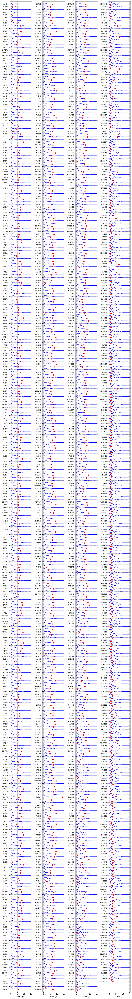

In [11]:
ncols = 4
autocorrelation_per_column = ceil(len(autocorrelations) / ncols)
autocorrelation_height = 0.2
column_height = autocorrelation_height * autocorrelation_per_column
fig, axs = plt.subplots(1, ncols, figsize=(10, column_height + 2), tight_layout=True)
for j, ax in enumerate(axs):
    i = 0
    column_stations = []
    while i < autocorrelation_per_column:
        try:
            auto = autocorrelations[j * autocorrelation_per_column + i]
        except IndexError:
            # plot nothing so that what is plotted doesn't get stretched along y
            ax.plot(auto.times(), auto.data + i, alpha=0)
            i += 1
            continue

        r0, Dt = get_filter_parameters(auto)

        level = autocorrelation_per_column - 1 - i
        ax.plot(auto.times(), auto.data + level, color="b", lw=1)
        ax.scatter([Dt], [-r0 + level], marker="o", color="r")

        column_stations.append(".".join([auto.meta.network, auto.meta.station]))
        i += 1

    while i:
        try:
            ax.set_yticks(
                np.arange(
                    autocorrelation_per_column - 1,
                    autocorrelation_per_column - 1 - i,
                    -1,
                )
            )
            ax.set_yticklabels(
                column_stations, fontsize="x-small", horizontalalignment="right"
            )
        except ValueError:  # i != len(column_stations)
            i -= 1
        else:
            break

for ax in axs:
    ax.set_ylim([-1, autocorrelation_per_column])
    ax.grid(True, ls="--")
    ax.set_xlabel("Time (s)")


Apply the filter to see how well it works

In [12]:
def apply_reverberation_filter(rrf, r0, Dt):
    rrf_filtered = rrf.copy()

    resonance_filter = np.zeros_like(rrf.data)
    resonance_filter[0] = 1
    resonance_filter[int(Dt * rrf.stats.sampling_rate)] = r0

    rrf_filtered.data = np.convolve(rrf_filtered.data, resonance_filter, mode='full')
    rrf_filtered.data = rrf_filtered.data[:len(rrf_filtered.data) // 2 + 1]

    assert rrf.data.shape == rrf_filtered.data.shape, 'Input/output length mismatch detected in ' \
                                                'reverberation removal routine'

    return rrf_filtered


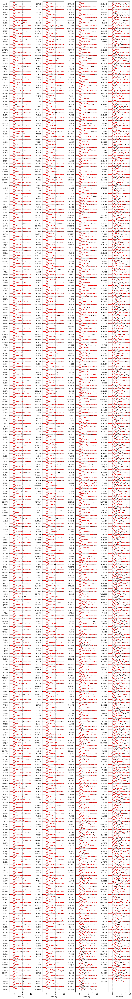

In [16]:
delays = [trace.stats.delay for trace in stacks]
nstacks = len(stacks)
ncols = 4
stacks_per_column = ceil(nstacks / ncols)

stack_height = 0.2
column_height = stack_height * stacks_per_column
fig, axs = plt.subplots(1, ncols, figsize=(10, column_height + 2), tight_layout=True)
for j, ax in enumerate(axs):
    i = 0
    column_stations = []
    while i < stacks_per_column:
        try:
            _i = j * stacks_per_column + i
            stack = stacks[_i]
            auto = autocorrelations[_i]
            assert (
                stack.id == auto.id
            ), "The sorting of the RF stacks and their autocorrelations must have changed."

            r0, Dt = get_filter_parameters(auto)
            rv_stack = apply_reverberation_filter(stack, r0, Dt)

            assert (
                stack.id == rv_stack.id
            ), f"Stack id {stack.id} does not match that from reverb_filter_stack {rv_stack.id}"
        except IndexError:
            # plot nothing so that what is plotted doesn't get stretched along y
            ax.plot(times, data + i, alpha=0)
            i += 1
            continue
        for _stack, style in zip([stack, rv_stack], ["k", "r"]):
            times = _stack.times() - _stack.stats.onset.second
            # print(stack)
            data = _stack.data
            data /= data.max()
            level = stacks_per_column - 1 - i
            ax.plot(times, data + level, style, lw=1)
        column_stations.append(".".join([_stack.meta.network, _stack.meta.station]))
        i += 1
    while i:
        try:
            ax.set_yticks(
                np.arange(stacks_per_column - 1, stacks_per_column - 1 - i, -1)
            )
            ax.set_yticklabels(
                column_stations, fontsize="x-small", horizontalalignment="right"
            )
        except ValueError:  # i != len(column_stations)
            i -= 1
        else:
            break

for ax in axs:
    ax.xaxis.set_minor_locator(MultipleLocator(2.5))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.set_xlim([-2.5, 10])
    ax.set_ylim([-1, stacks_per_column])
    ax.grid(True, ls="--")
    ax.set_xlabel("Time (s)")


[Cunningham \& Lekic, 2019](https://academic.oup.com/gji/article/219/1/313/5527323) Criteria for applying reverberation filter

1. ` the variance of the differences between the sediment removed Ps RF and the original Ps RF (v1) be larger than the variance of the differences between the autocorrelation of the original Ps RF and the resonance filter (v2)`

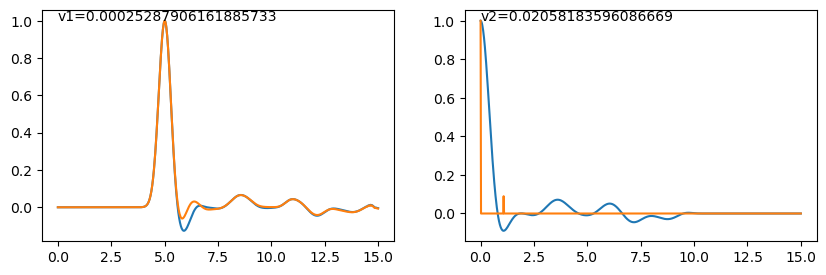

In [39]:
# example of where it shouldn't be applied i.e. v2 > v1
net = "OA"
sta = "BN29"
rrf = stacks.select(network=net, station=sta)[0]
auto = autocorrelations.select(network=net, station=sta)[0]
r0, Dt = get_filter_parameters(auto)
rrf_filtered = apply_reverberation_filter(rrf, r0, Dt)
v1 = np.var(rrf.data - rrf_filtered.data)

resonance_filter = np.zeros_like(rrf.data)
resonance_filter[0] = 1
resonance_filter[int(Dt * rrf.stats.sampling_rate)] = r0
v2 = np.var(auto.data - resonance_filter)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
axs[0].plot(rrf.times(), rrf.data, rrf_filtered.times(), rrf_filtered.data)
axs[0].text(0, 1, f"v1={v1}")

axs[1].plot(auto.times(), auto.data, auto.times(), resonance_filter)
axs[1].text(0, 1, f"v2={v2}")

assert v2 > v1

AssertionError: 

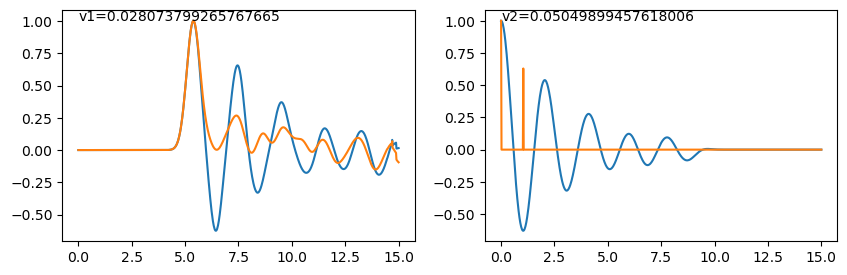

In [40]:
# example of where it should be applied i.e. v1 > v2
net = "7B"
sta = "SB06"
rrf = stacks.select(network=net, station=sta)[0]
auto = autocorrelations.select(network=net, station=sta)[0]
r0, Dt = get_filter_parameters(auto)
rrf_filtered = apply_reverberation_filter(rrf, r0, Dt)
v1 = np.var(rrf.data - rrf_filtered.data)

resonance_filter = np.zeros_like(rrf.data)
resonance_filter[0] = 1
resonance_filter[int(Dt * rrf.stats.sampling_rate)] = r0
v2 = np.var(auto.data - resonance_filter)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
axs[0].plot(rrf.times(), rrf.data, rrf_filtered.times(), rrf_filtered.data)
axs[0].text(0, 1, f"v1={v1}")

axs[1].plot(auto.times(), auto.data, auto.times(), resonance_filter)
axs[1].text(0, 1, f"v2={v2}")

assert v2 < v1

In [103]:
f = np.fft.fftfreq(rrf.data.size, rrf.stats.delta)
filter_fourier = 1 + 0.3 * np.exp(-1j * 2*np.pi * f * 2)

/Users/auggiemarignier/miniforge3/envs/aussedthick/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


(0.0, 10.0)

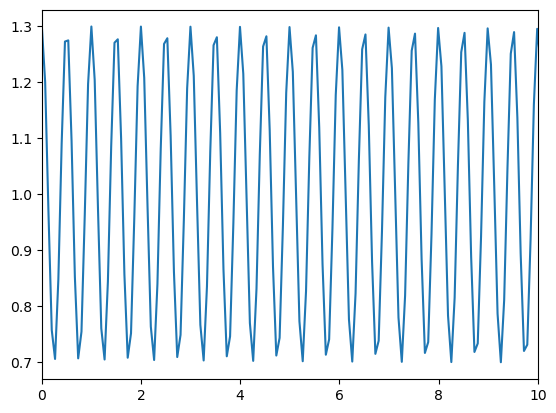

In [104]:
plt.plot(f[:f.size // 2], filter_fourier[:f.size // 2])
plt.xlim([0, 10])

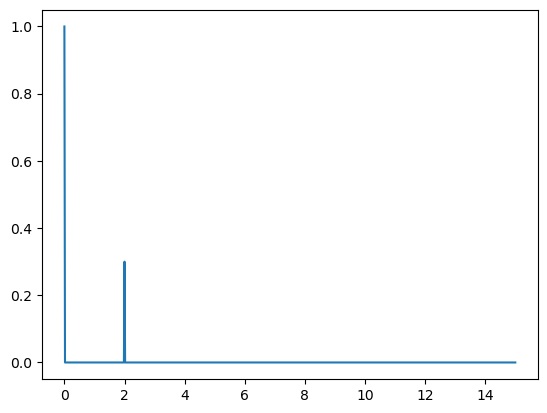

In [105]:
plt.plot(rrf.times(), np.fft.ifft(filter_fourier))